## Parte I. Carácterísticas de calidad de los datos

In [1]:
import os
print("Ruta actual del notebook:", os.getcwd())

Ruta actual del notebook: C:\Users\hruiz\OneDrive\Documentos\MIAD\Proyecto aplicado


In [3]:
import pandas as pd
import plotly.express as px

In [5]:
# Carga de datos desde la ruta en Colab
ruta_archivo = 'Datos.xlsx'
excel_data = pd.ExcelFile(ruta_archivo)

# Mostrar nombres de las hojas en el archivo Excel
print("Hojas disponibles en el archivo:")
print(excel_data.sheet_names)

Hojas disponibles en el archivo:
['CLIENTE1', 'CLIENTE2', 'CLIENTE3', 'CLIENTE4', 'CLIENTE5', 'CLIENTE6', 'CLIENTE7', 'CLIENTE8', 'CLIENTE9', 'CLIENTE10', 'CLIENTE11', 'CLIENTE12', 'CLIENTE13', 'CLIENTE14', 'CLIENTE15', 'CLIENTE16', 'CLIENTE17', 'CLIENTE18', 'CLIENTE19', 'CLIENTE20']


In [7]:
# Crear un diccionario con un DataFrame por cada hoja
dataframes_dict = {sheet: excel_data.parse(sheet) for sheet in excel_data.sheet_names}

In [9]:
# Crear un resumen del número total de registros por variable para cada cliente
summary_dict = {}

for sheet_name, df in dataframes_dict.items():
    summary = df.notnull().sum()  # Contar valores no nulos por columna
    summary_dict[sheet_name] = summary

# Convertir el resumen en un DataFrame para visualizar los resultados
summary_df = pd.DataFrame(summary_dict)

# Transponer el DataFrame para que las filas representen los clientes
summary_df = summary_df.T
summary_df.index.name = "Cliente"

# Mostrar el resumen
summary_df

,Fecha,Presion,Temperatura,Volumen
Cliente,,,,
CLIENTE1,43412,43412,43412,43412
CLIENTE2,41382,41382,41382,41382
CLIENTE3,42248,42248,42248,42248
CLIENTE4,42305,42305,42305,42305
CLIENTE5,43415,43415,43415,43415
CLIENTE6,42808,42808,42808,42808
CLIENTE7,41776,41776,41776,41776
CLIENTE8,43147,43147,43147,43147
CLIENTE9,42428,42428,42428,42428


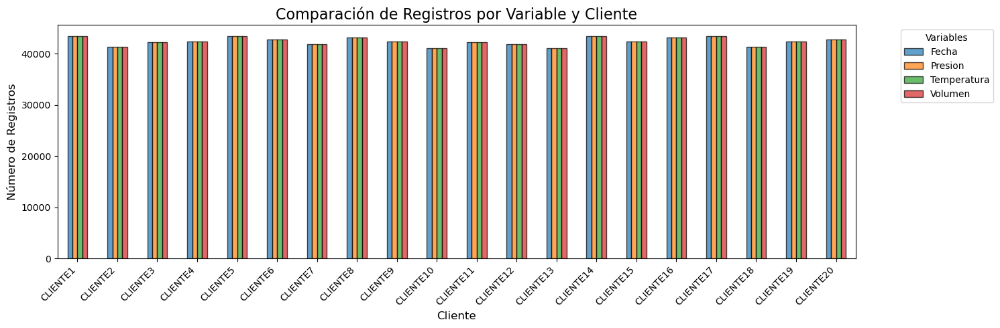

In [11]:
import matplotlib.pyplot as plt

# Preparar los datos para el gráfico
summary_df_plot = summary_df.copy()
summary_df_plot.plot(kind='bar', figsize=(15, 5), edgecolor="black", alpha=0.7)

# Configuración del gráfico
plt.title("Comparación de Registros por Variable y Cliente", fontsize=16)
plt.xlabel("Cliente", fontsize=12)
plt.ylabel("Número de Registros", fontsize=12)
plt.xticks(rotation=45, ha="right")
plt.legend(title="Variables", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [13]:
# Concatenar todas las hojas en un solo DataFrame, añadiendo una columna con el nombre del cliente
combined_df = pd.concat(
    [excel_data.parse(sheet).assign(Cliente=sheet) for sheet in excel_data.sheet_names],
    ignore_index=True)

In [15]:
# Tipo de datos de cada una de las columnas del DataFrame combinado
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 847960 entries, 0 to 847959
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Fecha        847960 non-null  datetime64[ns]
 1   Presion      847960 non-null  float64       
 2   Temperatura  847960 non-null  float64       
 3   Volumen      847960 non-null  float64       
 4   Cliente      847960 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(1)
memory usage: 32.3+ MB


In [17]:
# Inicializar un diccionario para almacenar los resultados del análisis de calidad
quality_report = {}

# Process each sheet individually to assess quality
for sheet in excel_data.sheet_names:
    df = excel_data.parse(sheet)
    report = {
        "Total Columns": df.shape[1],
        "Total Rows": df.shape[0],
        "Missing Values (Total)": df.isnull().sum().sum(),
        "Missing Values (Columns)": df.isnull().sum().to_dict(),
        "Column Data Types": df.dtypes.to_dict(),
        "Duplicated Rows": df.duplicated().sum(),
    }
    quality_report[sheet] = report

#Converir en DataFrame para mejorar la vizualización
quality_df = pd.DataFrame(quality_report).T

In [19]:
# Seleccionar únicamente las columnas numéricas para el análisis
numeric_columns = combined_df.select_dtypes(include='number').columns

# Especificar el orden personalizado de los clientes
custom_order = ['CLIENTE1', 'CLIENTE2', 'CLIENTE3', 'CLIENTE4', 'CLIENTE5',
                'CLIENTE6', 'CLIENTE7', 'CLIENTE8', 'CLIENTE9', 'CLIENTE10',
                'CLIENTE11', 'CLIENTE12', 'CLIENTE13', 'CLIENTE14', 'CLIENTE15',
                'CLIENTE16', 'CLIENTE17', 'CLIENTE18', 'CLIENTE19', 'CLIENTE20']

# Crear un diccionario para almacenar un DataFrame por cada variable
analysis_dict = {}

for variable in numeric_columns:
    # Realizar el análisis estadístico para la variable actual
    df_stats = combined_df.groupby('Cliente')[variable].agg(['mean', 'var', 'min', 'max'])

    # Cambiar nombres de columnas
    df_stats.columns = ['Media', 'Varianza', 'Mínimo', 'Máximo']

    # Aplicar el orden personalizado
    df_stats = df_stats.loc[pd.CategoricalIndex(df_stats.index, categories=custom_order, ordered=True)].dropna(how="all")

    # Almacenar en el diccionario
    analysis_dict[variable] = df_stats

# Mostrar los resultados de un ejemplo
for variable, df in analysis_dict.items():
    print(f"Análisis estadístico para la variable: {variable}")
    print(df)
    print("\n")

Análisis estadístico para la variable: Presion
               Media  Varianza     Mínimo     Máximo
Cliente                                             
CLIENTE1   17.535934  0.128386  15.742337  18.074274
CLIENTE10  17.473694  0.018207  16.469864  18.573079
CLIENTE11   3.545512  0.006848   2.934873   3.954039
CLIENTE12  17.833667  0.175134  13.740922  20.232110
CLIENTE13  17.492521  0.014416  16.505077  18.471047
CLIENTE14  17.517128  0.136231  13.616877  20.028395
CLIENTE15  17.495812  0.019406  16.514496  18.493234
CLIENTE16  16.705058  0.242393  14.734521  19.440780
CLIENTE17  17.533599  0.144412  15.265703  18.445378
CLIENTE18  17.554599  0.063612  16.215105  17.821359
CLIENTE19  17.667217  0.105514  16.247484  18.258619
CLIENTE2   17.526440  0.101751  16.129015  18.106402
CLIENTE20  17.579587  0.166682  14.849737  18.578203
CLIENTE3    3.569593  0.006499   3.057171   4.037030
CLIENTE4   17.639754  0.152739  15.214996  20.112931
CLIENTE5   17.489345  0.137192  14.489896  19.009352

In [21]:
# Crear un diccionario para almacenar un DataFrame con los duplicados por cliente
duplicated_records = {}

for cliente, group in combined_df.groupby('Cliente'):
    # Identificar filas con fechas duplicadas
    duplicated_df = group[group.duplicated(subset='Fecha', keep=False)]
    duplicated_records[cliente] = duplicated_df

# Mostrar un ejemplo de resultados
for cliente, df in duplicated_records.items():
    print(f"Registros duplicados para el cliente: {cliente}")
    print(df)
    print("\n")

Registros duplicados para el cliente: CLIENTE1
Empty DataFrame
Columns: [Fecha, Presion, Temperatura, Volumen, Cliente]
Index: []


Registros duplicados para el cliente: CLIENTE10
Empty DataFrame
Columns: [Fecha, Presion, Temperatura, Volumen, Cliente]
Index: []


Registros duplicados para el cliente: CLIENTE11
                     Fecha   Presion  Temperatura     Volumen    Cliente
424377 2019-01-30 13:00:00  3.554041    28.487930  116.624994  CLIENTE11
424378 2019-01-30 13:00:00  3.480825    28.538652  100.330095  CLIENTE11


Registros duplicados para el cliente: CLIENTE12
Empty DataFrame
Columns: [Fecha, Presion, Temperatura, Volumen, Cliente]
Index: []


Registros duplicados para el cliente: CLIENTE13
Empty DataFrame
Columns: [Fecha, Presion, Temperatura, Volumen, Cliente]
Index: []


Registros duplicados para el cliente: CLIENTE14
Empty DataFrame
Columns: [Fecha, Presion, Temperatura, Volumen, Cliente]
Index: []


Registros duplicados para el cliente: CLIENTE15
Empty DataFrame
Col

## Parte II. Técnicas de limpieza de datos

In [23]:
# Crear un diccionario para almacenar los DataFrames resultantes
cleaned_dataframes = {}

for cliente, group in combined_df.groupby('Cliente'):
    # Seleccionar el registro con el valor máximo para cada fecha
    #cleaned_df = group.loc[group.groupby('Fecha').idxmax(numeric_only=True).iloc[:, 0]]
    cleaned_df = group.loc[group.groupby('Fecha').idxmax().iloc[:, 0]]
    cleaned_dataframes[cliente] = cleaned_df

# Mostrar un ejemplo de los resultados
for cliente, df in cleaned_dataframes.items():
    print(f"DataFrame limpio para el cliente: {cliente}")
    print(df)
    print("\n")

DataFrame limpio para el cliente: CLIENTE1
                    Fecha    Presion  Temperatura    Volumen   Cliente
0     2019-01-14 00:00:00  17.732563    28.209354  20.969751  CLIENTE1
1     2019-01-14 01:00:00  17.747776    28.518614  17.845739  CLIENTE1
2     2019-01-14 02:00:00  17.758916    28.230191  20.975914  CLIENTE1
3     2019-01-14 03:00:00  17.727940    27.811509  20.592299  CLIENTE1
4     2019-01-14 04:00:00  17.746484    27.795293  21.690626  CLIENTE1
...                   ...        ...          ...        ...       ...
43407 2023-12-31 19:00:00  15.917746    27.012471   9.288101  CLIENTE1
43408 2023-12-31 20:00:00  15.905184    26.428474   4.746021  CLIENTE1
43409 2023-12-31 21:00:00  15.915647    26.275375  13.040214  CLIENTE1
43410 2023-12-31 22:00:00  15.934438    26.056568   9.736423  CLIENTE1
43411 2023-12-31 23:00:00  15.885152    26.504426  10.038946  CLIENTE1

[43412 rows x 5 columns]


DataFrame limpio para el cliente: CLIENTE10
                     Fecha    Pre

## Parte III. Detección de Outliers

Detección de Outliers por método IQR para cada cliente

Rango de fechas en los datos:
Fecha mínima: 2019-01-14 00:00:00
Fecha máxima: 2023-12-31 23:00:00
Periodo total: 1812 días


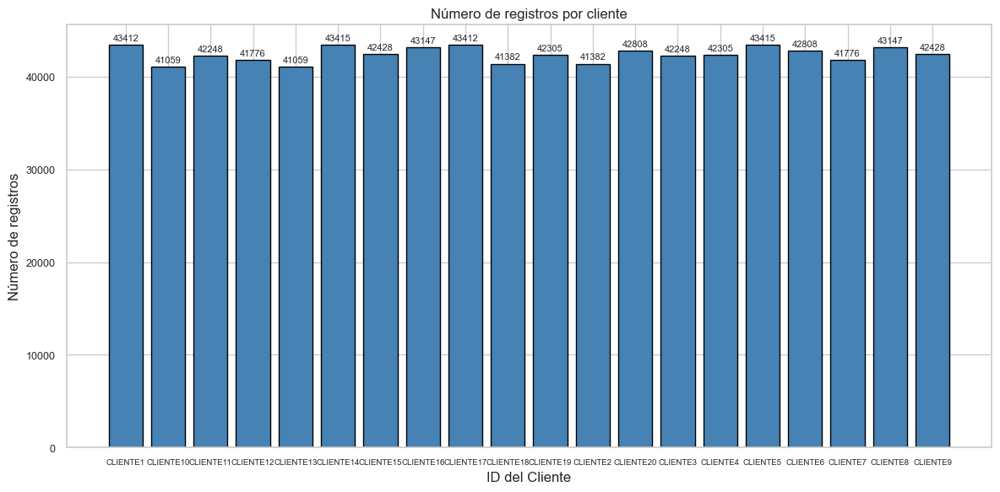


Detectando outliers usando el método IQR para cada cliente y variable...
  Variable Presion: 73064 outliers detectados (8.62%)
  Variable Temperatura: 593 outliers detectados (0.07%)
  Variable Volumen: 46737 outliers detectados (5.51%)

Total: 109632 registros (12.93%) son outliers en al menos una variable


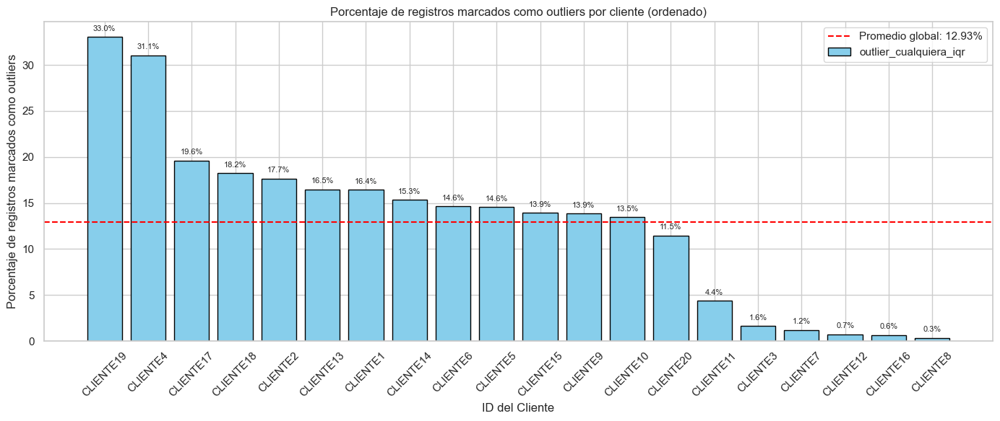

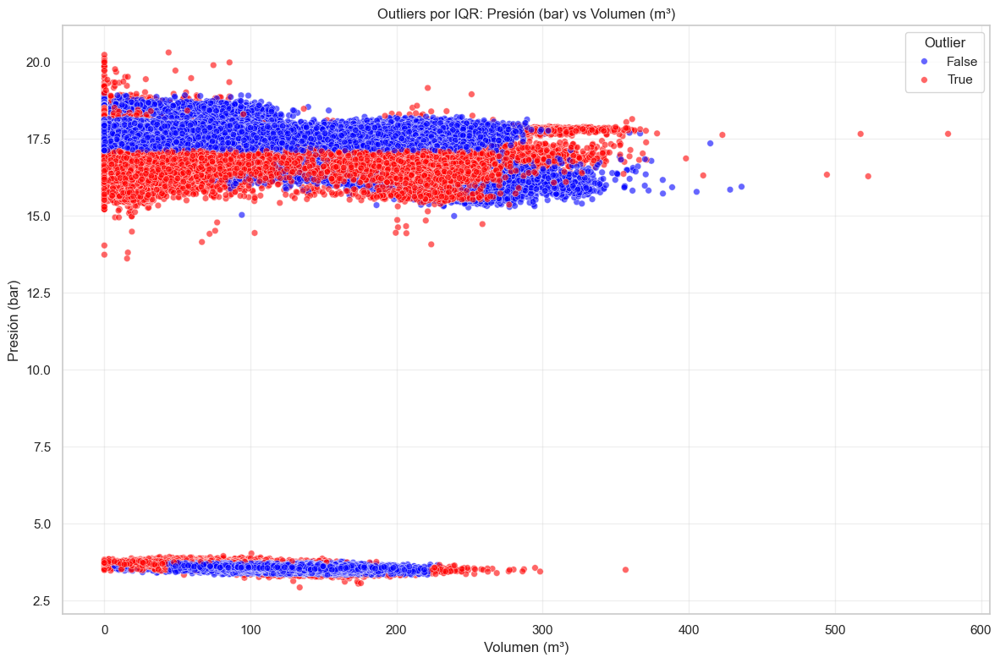

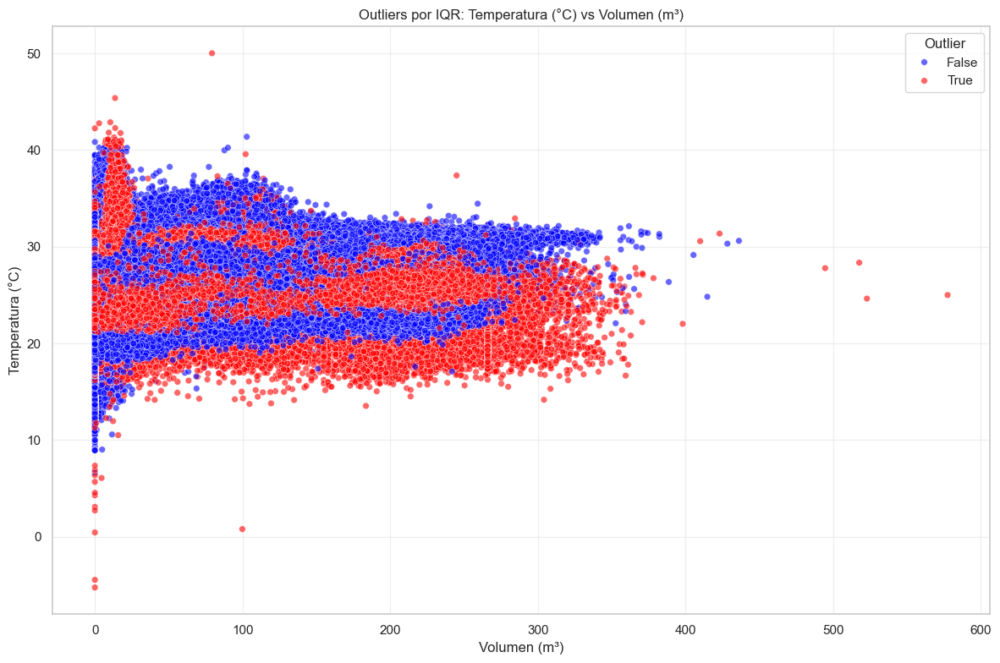

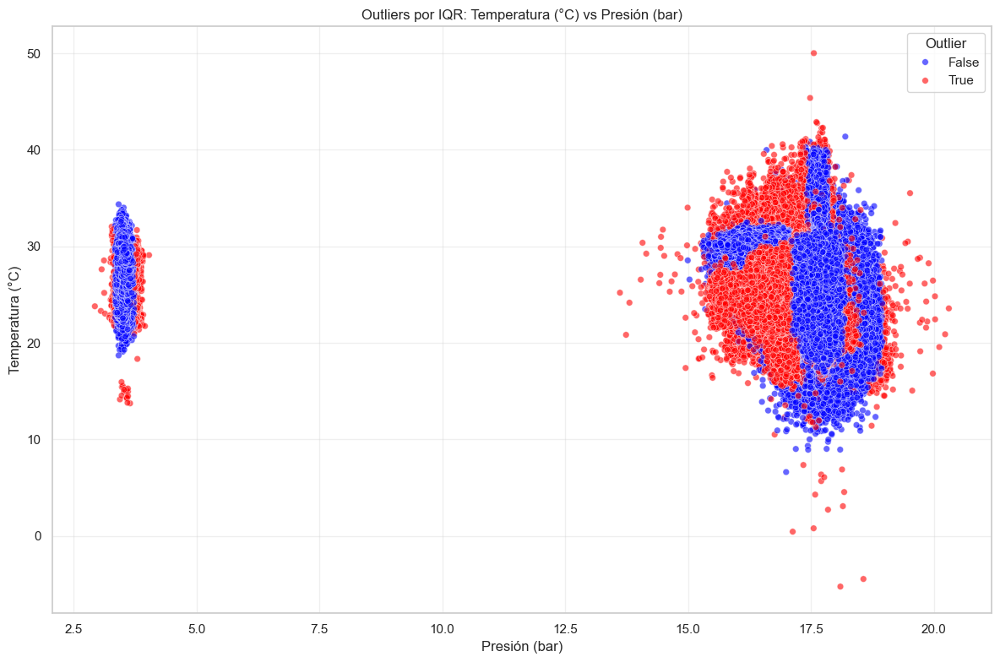

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# 1. Rango de fechas
# -----------------------------
combined_df['Fecha'] = pd.to_datetime(combined_df['Fecha'])

fecha_min = combined_df['Fecha'].min()
fecha_max = combined_df['Fecha'].max()
dias_totales = (fecha_max - fecha_min).days

print("Rango de fechas en los datos:")
print("Fecha mínima:", fecha_min)
print("Fecha máxima:", fecha_max)
print("Periodo total:", dias_totales, "días")

# -----------------------------
# 2. Número de registros por cliente
# -----------------------------

conteo_por_cliente = combined_df['Cliente'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
bars = plt.bar(conteo_por_cliente.index, conteo_por_cliente.values, color='steelblue', edgecolor='black')

# Mostrar número exacto encima de cada barra
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 300,
             f'{int(height)}', ha='center', va='bottom', fontsize=8)

plt.title('Número de registros por cliente')
plt.xlabel('ID del Cliente')
plt.ylabel('Número de registros')
plt.xticks(ticks=conteo_por_cliente.index, labels=conteo_por_cliente.index, rotation=0, fontsize=7)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()



# -----------------------------
# 3. Detección de outliers por IQR
# -----------------------------
variables_analisis = ['Presion', 'Temperatura', 'Volumen']

print("\nDetectando outliers usando el método IQR para cada cliente y variable...")
for variable in variables_analisis:
    col_outlier = f'outlier_{variable}_iqr'
    combined_df[col_outlier] = False
    
    for cliente in combined_df['Cliente'].unique():
        mask_cliente = combined_df['Cliente'] == cliente
        df_cliente = combined_df[mask_cliente]
        
        Q1 = df_cliente[variable].quantile(0.25)
        Q3 = df_cliente[variable].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        
        outliers = (df_cliente[variable] < limite_inferior) | (df_cliente[variable] > limite_superior)
        combined_df.loc[mask_cliente, col_outlier] = outliers

    num_outliers = combined_df[col_outlier].sum()
    porcentaje = 100 * num_outliers / len(combined_df)
    print(f"  Variable {variable}: {num_outliers} outliers detectados ({porcentaje:.2f}%)")

# Columna resumen
combined_df['outlier_cualquiera_iqr'] = (
    combined_df['outlier_Presion_iqr'] |
    combined_df['outlier_Temperatura_iqr'] |
    combined_df['outlier_Volumen_iqr']
)

total_outliers = combined_df['outlier_cualquiera_iqr'].sum()
porcentaje_total = 100 * total_outliers / len(combined_df)
print(f"\nTotal: {total_outliers} registros ({porcentaje_total:.2f}%) son outliers en al menos una variable")

# -----------------------------
# 4. Porcentaje de outliers por cliente (ordenado)
# -----------------------------
outliers_por_cliente = combined_df.groupby('Cliente')['outlier_cualquiera_iqr'].mean() * 100
outliers_por_cliente_sorted = outliers_por_cliente.sort_values(ascending=False)

plt.figure(figsize=(14, 6))
bars = plt.bar(outliers_por_cliente_sorted.index.astype(str), outliers_por_cliente_sorted.values,
               color='skyblue', edgecolor='black', label='outlier_cualquiera_iqr')

for bar, value in zip(bars, outliers_por_cliente_sorted.values):
    plt.text(bar.get_x() + bar.get_width() / 2, value + 0.5, f'{value:.1f}%', ha='center', va='bottom', fontsize=8)

plt.axhline(y=porcentaje_total, color='red', linestyle='--', label=f'Promedio global: {porcentaje_total:.2f}%')
plt.title('Porcentaje de registros marcados como outliers por cliente (ordenado)')
plt.xlabel('ID del Cliente')
plt.ylabel('Porcentaje de registros marcados como outliers')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# -----------------------------
# 5. Visualización de outliers (con unidades)
# -----------------------------
sns.set(style="whitegrid")

def scatter_outliers_con_unidades(x, y, df=combined_df, hue='outlier_cualquiera_iqr'):
    etiquetas = {
        'Presion': 'Presión (bar)',
        'Temperatura': 'Temperatura (°C)',
        'Volumen': 'Volumen (m³)'
    }
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=df, x=x, y=y, hue=hue, palette={0: 'blue', 1: 'red'}, alpha=0.6, s=30)
    plt.title(f"Outliers por IQR: {etiquetas[y]} vs {etiquetas[x]}")
    plt.xlabel(etiquetas[x])
    plt.ylabel(etiquetas[y])
    plt.legend(title='Outlier')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Volumen vs Presión
scatter_outliers_con_unidades('Volumen', 'Presion')

# Volumen vs Temperatura
scatter_outliers_con_unidades('Volumen', 'Temperatura')

# Presión vs Temperatura
scatter_outliers_con_unidades('Presion', 'Temperatura')


Outliers de todos los clientes combinados

C:\Users\hruiz\AppData\Local\Temp\ipykernel_13008\2527236745.py:28: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


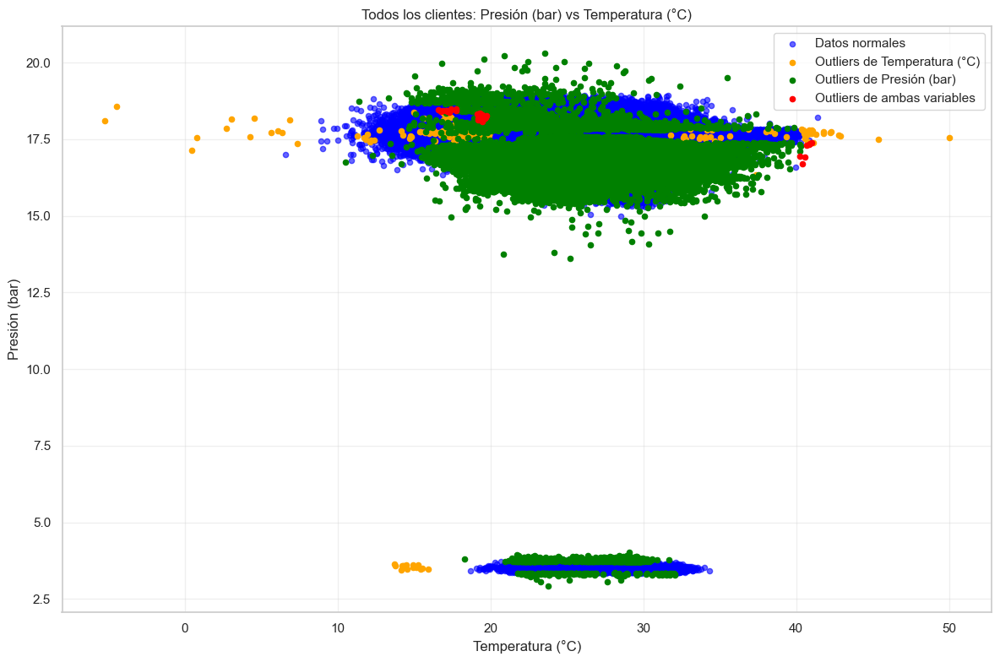

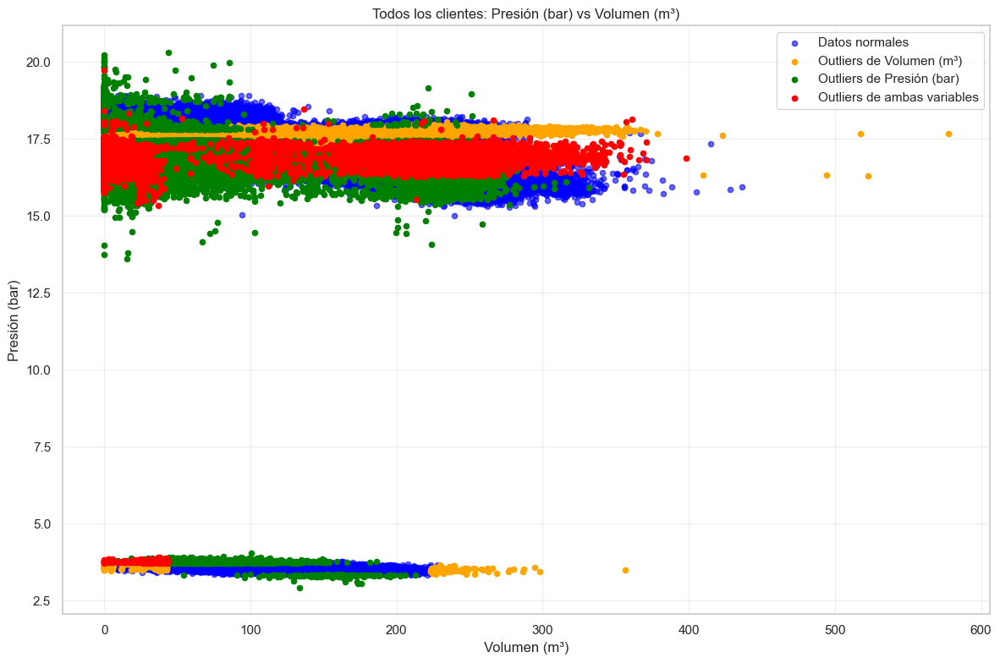

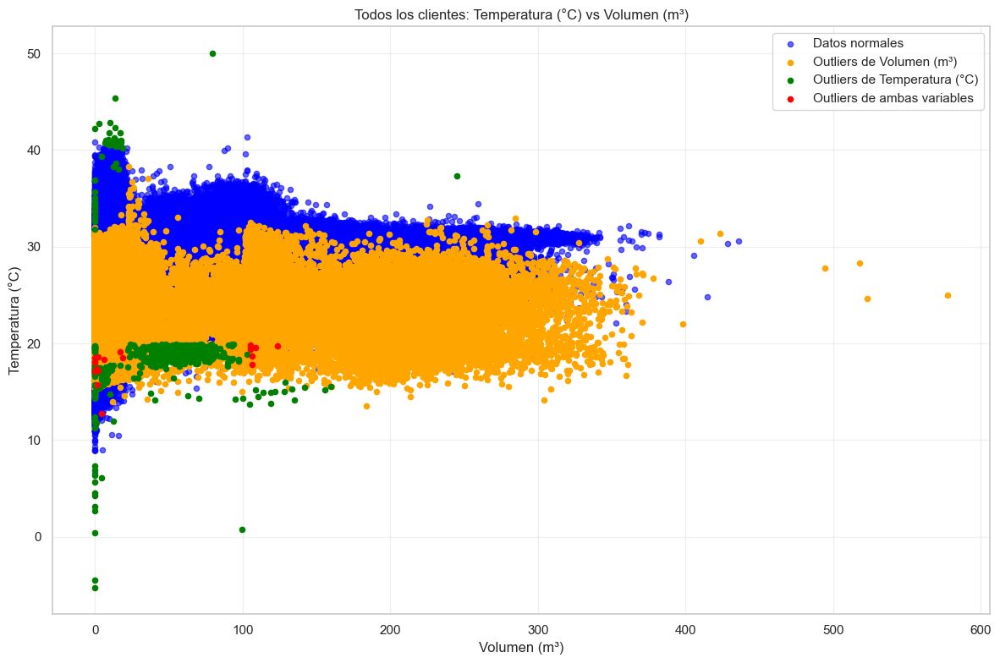

In [26]:
import matplotlib.pyplot as plt

def graficar_outliers_todos_los_clientes(x, y):
    etiquetas = {
        'Presion': 'Presión (bar)',
        'Temperatura': 'Temperatura (°C)',
        'Volumen': 'Volumen (m³)'
    }

    df = combined_df.copy()

    normales = ~(df[f'outlier_{x}_iqr'] | df[f'outlier_{y}_iqr'])
    outlier_x = df[f'outlier_{x}_iqr'] & ~df[f'outlier_{y}_iqr']
    outlier_y = ~df[f'outlier_{x}_iqr'] & df[f'outlier_{y}_iqr']
    outlier_ambos = df[f'outlier_{x}_iqr'] & df[f'outlier_{y}_iqr']

    plt.figure(figsize=(12, 8))
    plt.scatter(df.loc[normales, x], df.loc[normales, y], c='blue', label='Datos normales', s=20, alpha=0.6)
    plt.scatter(df.loc[outlier_x, x], df.loc[outlier_x, y], c='orange', label=f'Outliers de {etiquetas[x]}', s=20)
    plt.scatter(df.loc[outlier_y, x], df.loc[outlier_y, y], c='green', label=f'Outliers de {etiquetas[y]}', s=20)
    plt.scatter(df.loc[outlier_ambos, x], df.loc[outlier_ambos, y], c='red', label='Outliers de ambas variables', s=20)

    plt.title(f'Todos los clientes: {etiquetas[y]} vs {etiquetas[x]}')
    plt.xlabel(etiquetas[x])
    plt.ylabel(etiquetas[y])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ✅ Gráficas para todos los clientes combinados
graficar_outliers_todos_los_clientes('Temperatura', 'Presion')
graficar_outliers_todos_los_clientes('Volumen', 'Presion')
graficar_outliers_todos_los_clientes('Volumen', 'Temperatura')


C:\Users\hruiz\AppData\Local\Temp\ipykernel_13008\3590856446.py:48: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


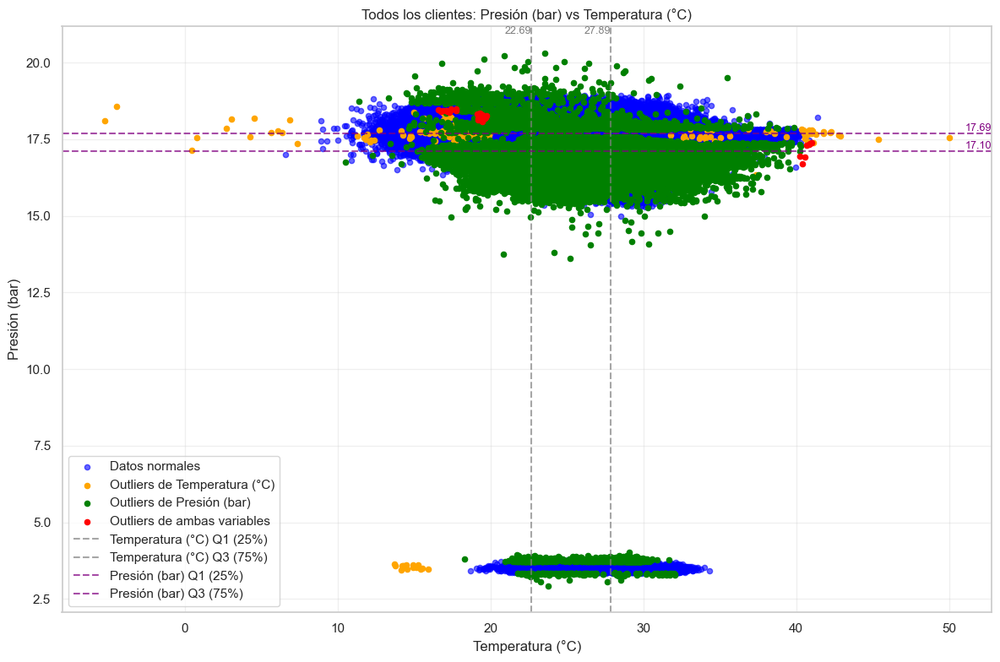

C:\Users\hruiz\AppData\Local\Temp\ipykernel_13008\3590856446.py:48: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


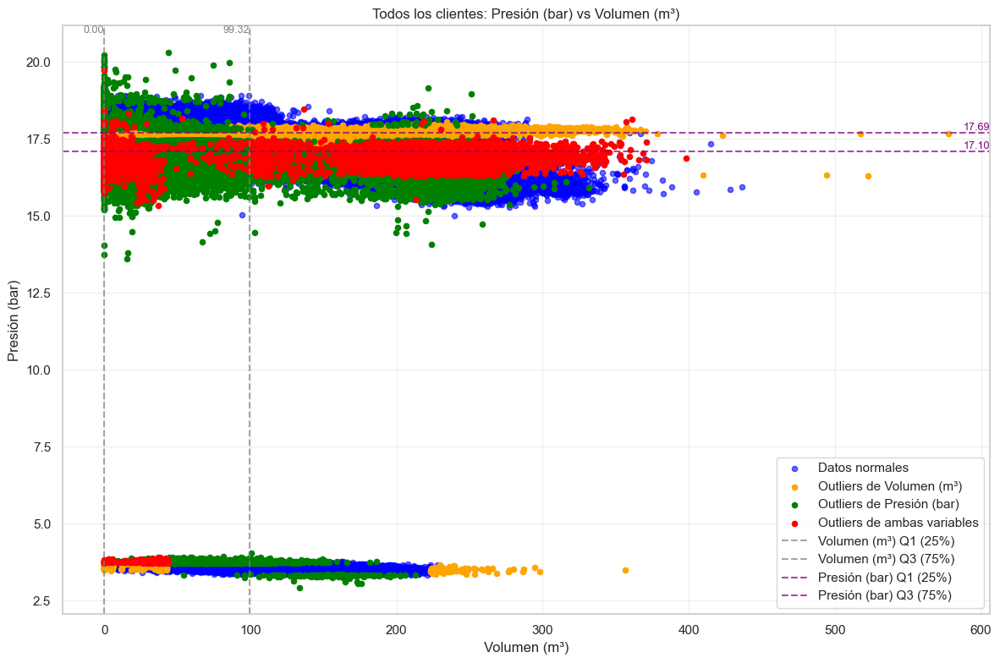

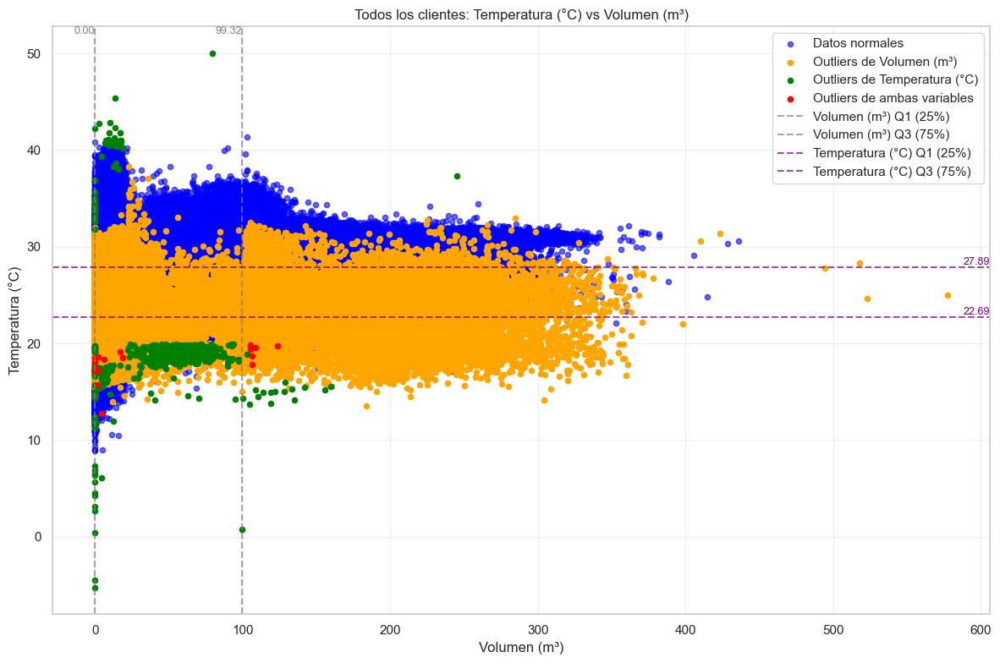

In [29]:
import matplotlib.pyplot as plt

def graficar_outliers_todos_los_clientes(x, y):
    etiquetas = {
        'Presion': 'Presión (bar)',
        'Temperatura': 'Temperatura (°C)',
        'Volumen': 'Volumen (m³)'
    }

    df = combined_df.copy()

    normales = ~(df[f'outlier_{x}_iqr'] | df[f'outlier_{y}_iqr'])
    outlier_x = df[f'outlier_{x}_iqr'] & ~df[f'outlier_{y}_iqr']
    outlier_y = ~df[f'outlier_{x}_iqr'] & df[f'outlier_{y}_iqr']
    outlier_ambos = df[f'outlier_{x}_iqr'] & df[f'outlier_{y}_iqr']

    # Calcular percentiles Q1 y Q3
    Q1_x = df[x].quantile(0.25)
    Q3_x = df[x].quantile(0.75)
    Q1_y = df[y].quantile(0.25)
    Q3_y = df[y].quantile(0.75)

    # Crear la gráfica
    plt.figure(figsize=(12, 8))
    plt.scatter(df.loc[normales, x], df.loc[normales, y], c='blue', label='Datos normales', s=20, alpha=0.6)
    plt.scatter(df.loc[outlier_x, x], df.loc[outlier_x, y], c='orange', label=f'Outliers de {etiquetas[x]}', s=20)
    plt.scatter(df.loc[outlier_y, x], df.loc[outlier_y, y], c='green', label=f'Outliers de {etiquetas[y]}', s=20)
    plt.scatter(df.loc[outlier_ambos, x], df.loc[outlier_ambos, y], c='red', label='Outliers de ambas variables', s=20)

    # Líneas de Q1 y Q3
    plt.axvline(Q1_x, color='gray', linestyle='--', alpha=0.7, label=f'{etiquetas[x]} Q1 (25%)')
    plt.axvline(Q3_x, color='gray', linestyle='--', alpha=0.7, label=f'{etiquetas[x]} Q3 (75%)')
    plt.axhline(Q1_y, color='purple', linestyle='--', alpha=0.7, label=f'{etiquetas[y]} Q1 (25%)')
    plt.axhline(Q3_y, color='purple', linestyle='--', alpha=0.7, label=f'{etiquetas[y]} Q3 (75%)')

    # Anotaciones de valores Q1 y Q3
    plt.text(Q1_x, plt.ylim()[1], f'{Q1_x:.2f}', color='gray', ha='right', va='top', fontsize=9)
    plt.text(Q3_x, plt.ylim()[1], f'{Q3_x:.2f}', color='gray', ha='right', va='top', fontsize=9)
    plt.text(plt.xlim()[1], Q1_y, f'{Q1_y:.2f}', color='purple', va='bottom', ha='right', fontsize=9)
    plt.text(plt.xlim()[1], Q3_y, f'{Q3_y:.2f}', color='purple', va='bottom', ha='right', fontsize=9)

    # Etiquetas y título
    plt.title(f'Todos los clientes: {etiquetas[y]} vs {etiquetas[x]}')
    plt.xlabel(etiquetas[x])
    plt.ylabel(etiquetas[y])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ------------------------------
# Llamadas para graficar con Q1 y Q3
# ------------------------------
graficar_outliers_todos_los_clientes('Temperatura', 'Presion')
graficar_outliers_todos_los_clientes('Volumen', 'Presion')
graficar_outliers_todos_los_clientes('Volumen', 'Temperatura')


1. Gráfica Temperatura (°C) vs Presión (bar)
La mayoria de los datos para la temperatura estan entre 22.69°C y 27.89°C.
La presión entre 17.10 bar y 17.69 bar.
Se observan outliers de presión (verde) tanto por encima como por debajo de este rango, incluso algunos por debajo de los 15 bar.
Hay outliers de temperatura (naranja) dispersos hacia ambos extremos, algunos cercanos a 0°C o mayores a 45°C.
2. Gráfica Temperatura (°C) vs Volumen (m3)
El volúmen normal se encuentra entre 0 m3 y 99.32 m3.
La presión entre 17.10 bar y 17.7 bar.
Volumen = 0 con presión normal o alta (puntos verticales a la izquierda).  Se podría interpretar que no hay consumo registrado pero si presión lo cual podría deberse a que el cliente no este consumiendo gas en ese instante (válvula cerrada), problemas de registro en el sensor de volumen o fugas no detectadas.
Los outliers de ambas variables (rojo) se encuentran en áreas donde el volumen es o muy bajo o muy alto.
3. Gráfica Temperatura (°C) vs Volumen (m3)
El volumen se encuentra en un rango entre 0 a 100m3.
La temperatura entre 22.69°C y 27.89°C
Hay puntos con temperaturas mayores a 40°C y volumen muy bajo o nulo.  Puede ser que no hay flujo pero si la temperatura medida o error de lectura.
Cuando el volumen supera los 100m3 y algunos cercanos a 500 m3 hay varios outliers, es decir el volumen presenta mayor variabilidad que la temperarura.  Puede deberse a clientes con comportamientos extremos, como clientes indusriales que consumen mucho más gas que el cliente residencial, alta estacionalidad o patrones de uso con mucha disperision, cambios operativos por inicio de máquinas y errores de calibración de los medidores.
Hay muy pocos outliers por temperatura.

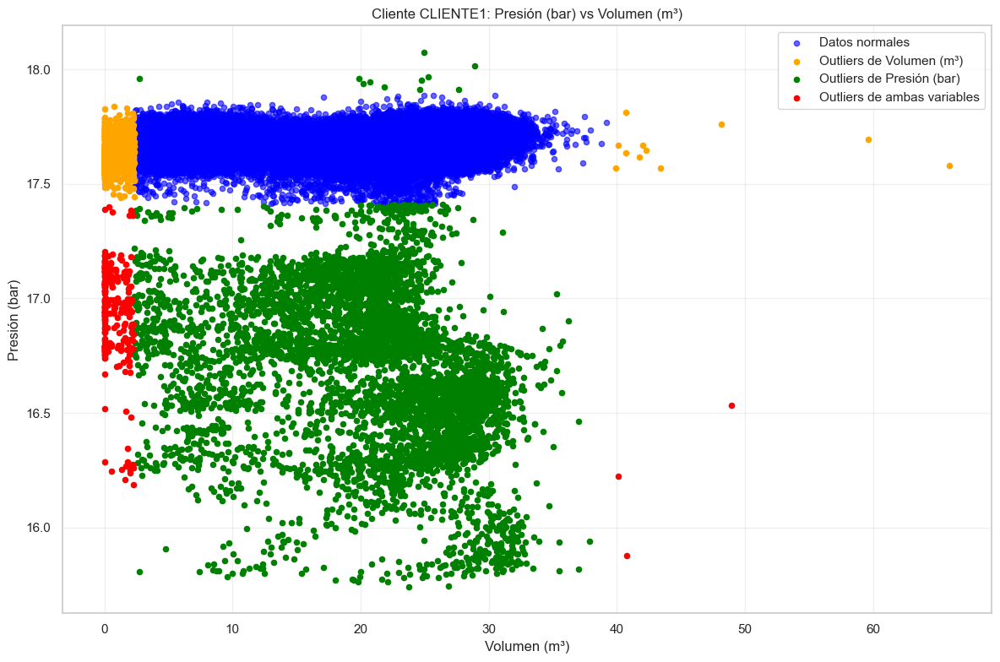

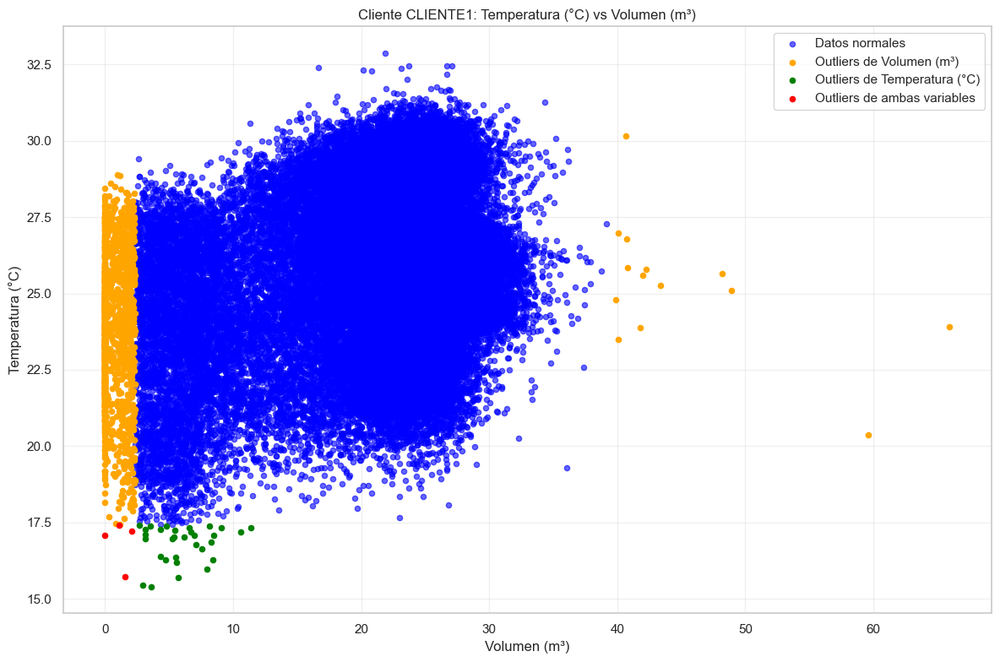

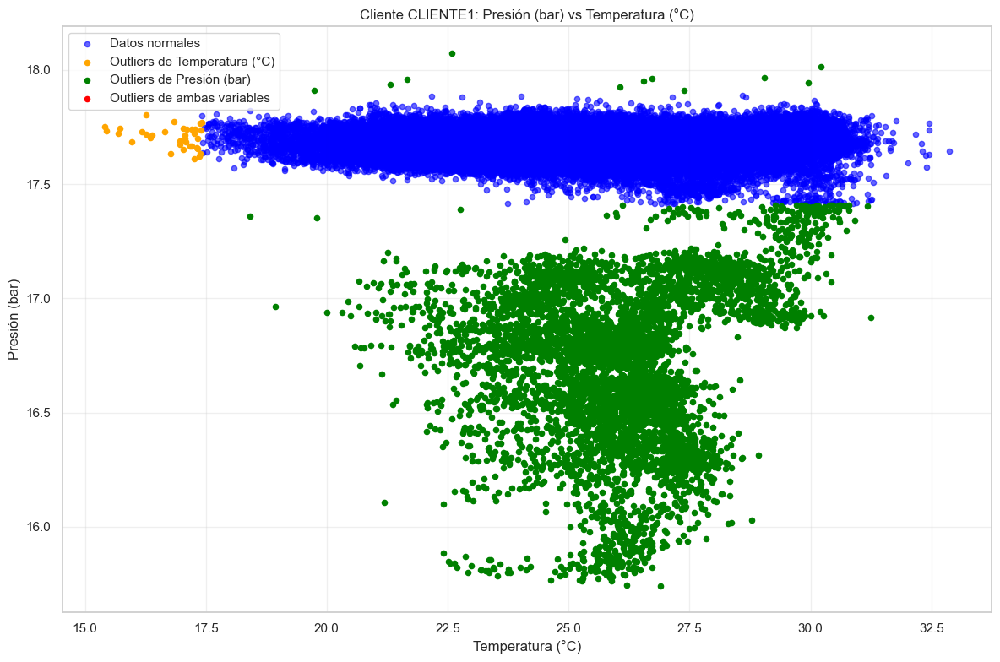

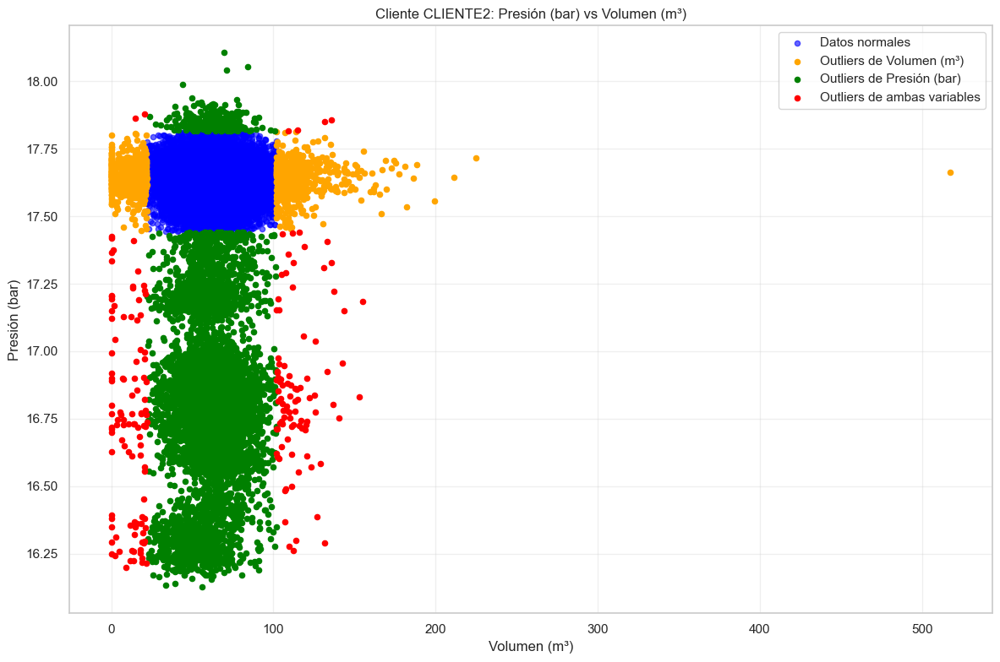

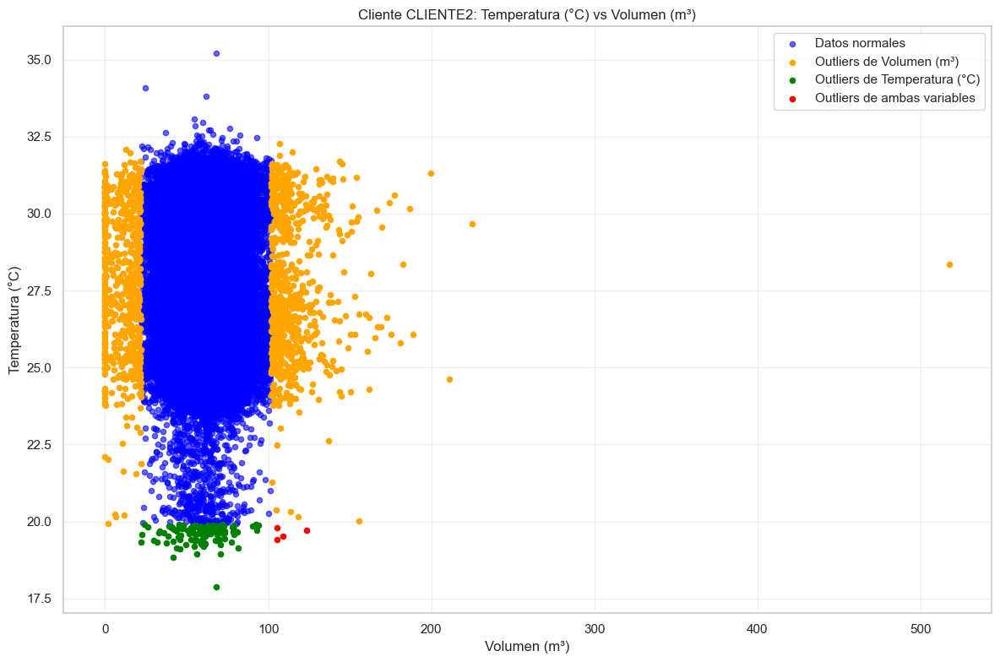

...

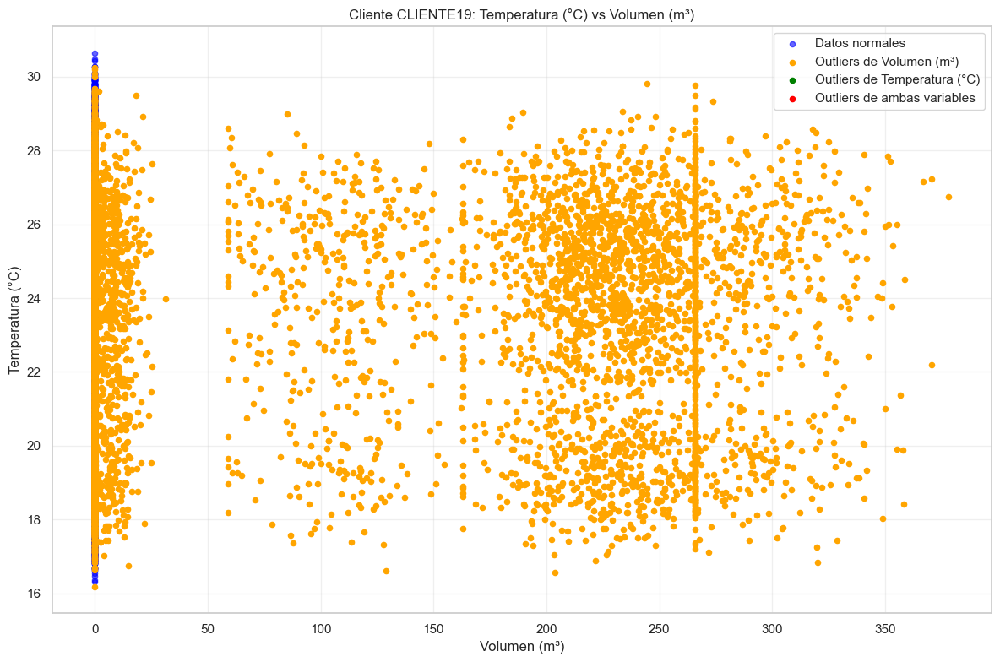

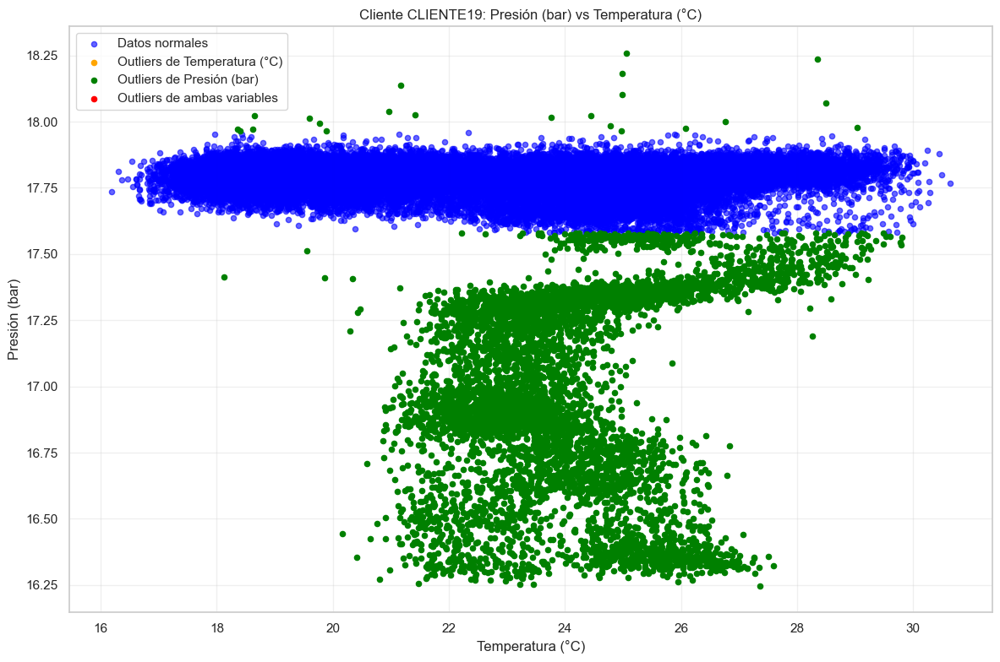

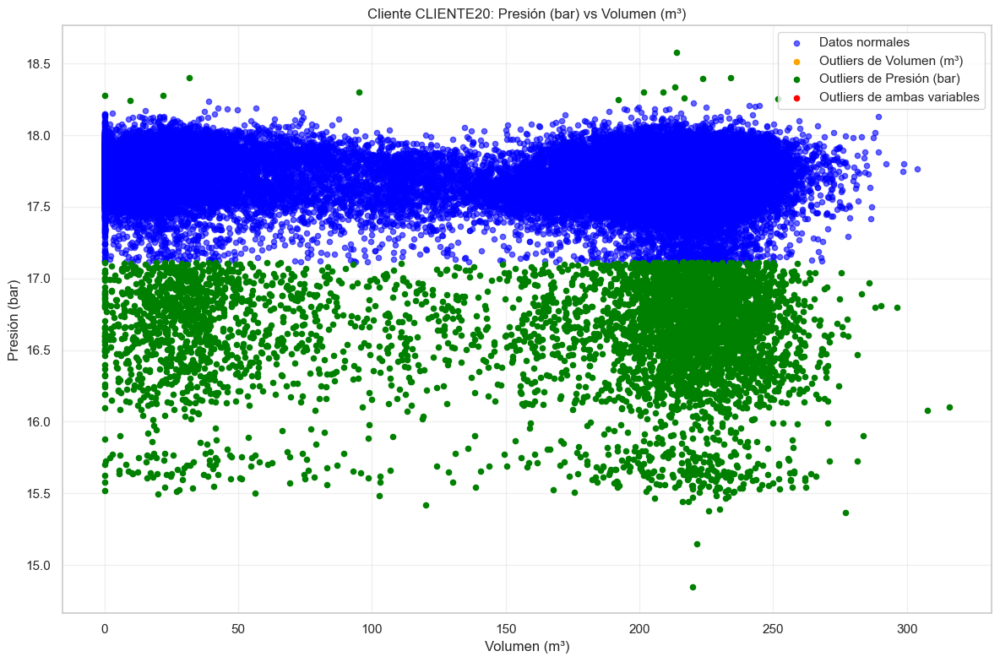

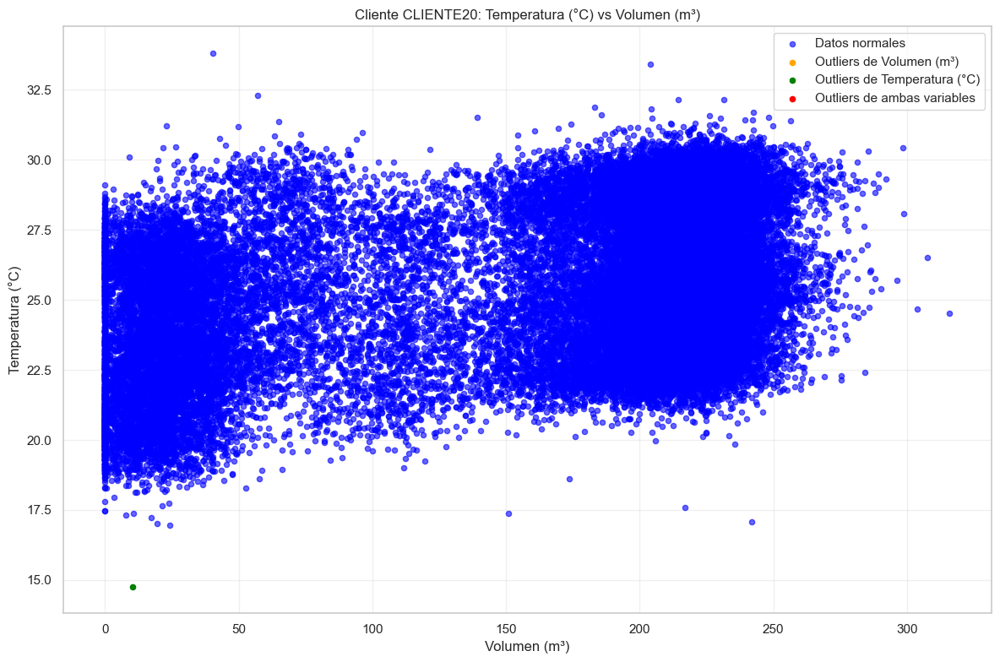

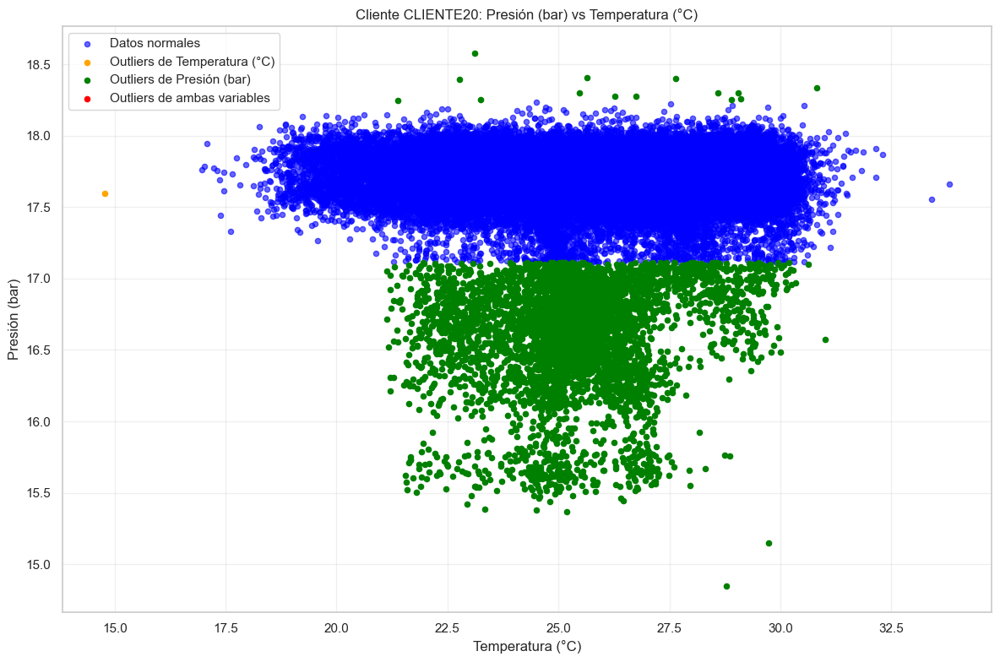

In [31]:
# -----------------------------
# 6. Visualización de outliers por cliente (detallado para todas las combinaciones)
# -----------------------------
def graficar_outliers_por_cliente(cliente_id, x, y):
    etiquetas = {
        'Presion': 'Presión (bar)',
        'Temperatura': 'Temperatura (°C)',
        'Volumen': 'Volumen (m³)'
    }

    df_cliente = combined_df[combined_df['Cliente'] == cliente_id].copy()

    if df_cliente.empty or df_cliente[[x, y]].dropna().empty:
        print(f"Cliente {cliente_id} no tiene datos suficientes para graficar {x} vs {y}.")
        return

    normales = ~(df_cliente[f'outlier_{x}_iqr'] | df_cliente[f'outlier_{y}_iqr'])
    outlier_x = df_cliente[f'outlier_{x}_iqr'] & ~df_cliente[f'outlier_{y}_iqr']
    outlier_y = ~df_cliente[f'outlier_{x}_iqr'] & df_cliente[f'outlier_{y}_iqr']
    outlier_ambos = df_cliente[f'outlier_{x}_iqr'] & df_cliente[f'outlier_{y}_iqr']

    plt.figure(figsize=(12, 8))
    plt.scatter(df_cliente.loc[normales, x], df_cliente.loc[normales, y], c='blue', label='Datos normales', s=20, alpha=0.6)
    plt.scatter(df_cliente.loc[outlier_x, x], df_cliente.loc[outlier_x, y], c='orange', label=f'Outliers de {etiquetas[x]}', s=20)
    plt.scatter(df_cliente.loc[outlier_y, x], df_cliente.loc[outlier_y, y], c='green', label=f'Outliers de {etiquetas[y]}', s=20)
    plt.scatter(df_cliente.loc[outlier_ambos, x], df_cliente.loc[outlier_ambos, y], c='red', label='Outliers de ambas variables', s=20)

    plt.title(f'Cliente {cliente_id}: {etiquetas[y]} vs {etiquetas[x]}')
    plt.xlabel(etiquetas[x])
    plt.ylabel(etiquetas[y])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# -----------------------------
# Ejecutar para todos los clientes y las tres combinaciones
# -----------------------------
clientes = combined_df['Cliente'].unique()

# Las combinaciones deseadas
combinaciones = [
    ('Volumen', 'Presion'),
    ('Volumen', 'Temperatura'),
    ('Temperatura', 'Presion')  # ✅ La que faltaba
]

# Ejecutar todas las gráficas por cliente
for cliente_id in clientes:
    for x, y in combinaciones:
        graficar_outliers_por_cliente(cliente_id, x=x, y=y)


CLIENTE 1: la mayoría de los registros son normales (en azul), concentrados en rangos típicos de operación:  Presión: ~17.5 a 17.8 bar; Temperatura: ~22 a 32 °C Y Volumen: ~5 a 35 m³.
Se presentan outliers relevantes cuando donde la presión en estable se mantiene alta incluso con volumen cero, lo que puede reflejar bloqeuos, válvulas cerradas o lecturas erroneas.  
El volumen tiene una dispersión significativa, lo que podría estar relacionado con variaiones de demanda en ciertos días o ser un cliente industrial que presenta alto consumo.

CLIENTE 2: La mayoria de los datos normales se concentran en volúmenes entre 20 y 100 m3; presión: 17.5 bar y temperatura: 20 a 32°C. El volumen es la variable con mayor dispersión y presencia de outliers, especialmente hacia valores extremos superiores, lo cual podría reflejar consumos atípicos o errores de medición. La presión se mantiene relativamente estable, aunque se presentan varios registros por debajo de 17 bar, que deben ser verificados por posibles deficiencias en la red o equipos. En cuanto a la temperatura, se concentra entre 25 °C y 30 °C, pero hay outliers hacia valores más bajos. No se evidencia una relación clara entre las variables, por lo que los outliers no se explican por correlaciones naturales, sino probablemente por condiciones anómalas puntuales. La combinación de volumen alto con presión baja en algunos casos sugiere eventos que podrían comprometer la operación segura del servicio.  Presenta una presión baja cuándo los volúmenes son bajos, lo cual puede indicar pérdidas, bloqueos o consumo cero con la válvula abierta.  

In [35]:
#Enviar dataframe a csv
combined_df.to_csv('Data_ajustado.csv', index=False)